<a href="https://colab.research.google.com/github/amir-asari/SEBB4083-Assignment2024/blob/main/G8_SEBB4083_Mini_Project_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Mini Project 2024 (Groceries Detection)
### Total marks: 30

### Group No.: 8

###Group Members:
1) AIN NURAISYAH BINTI ATAN (A20EB0002)

2) AINUR SUHADA BINTI MOHD AMIN (A20EB0003)

3) HANISAH BINTI MOHAMAD YAAKOB (A20EB0021)

4) NUR AMIRAH BINTI SAIDIN (A20EB0050)

5) TAN YEE HUI (A20EB0082)


## Chapter 1: Introduction

Visually impaired individuals face numerous challenges in their daily lives, including accessing and identifying grocery items independently during shopping. Traditional methods of identifying products, such as reading labels or seeking assistance from others, can be time-consuming and diminish their autonomy. Consequently, there is a growing need for technological solutions that empower visually impaired individuals to navigate and engage in everyday activities more independently.


The "Automated Groceries Detection for Visually Impaired Person Project" addresses this pressing need by leveraging advancements in computer vision and machine learning. By developing an automated algorithm capable of classifying groceries from captured images, this project aims to provide a seamless and efficient method for visually impaired individuals to differentiate between different products while shopping.


This project focuses on developing an algorithm based on Convolutional Neural Network (CNN) transfer learning to classify between two classes of groceries. Each group within the project will contribute to the development of this algorithm, specifically tasked with creating a local dataset and implementing the CNN model.


The significance of this project is to significantly improve the quality of life for visually impaired individuals. By enabling them to identify groceries independently, the project not only enhances their shopping experience but also promotes their overall autonomy and confidence in navigating public spaces.

###1.1 Background of study and related works

Visually impaired individuals encounter significant barriers in identifying and accessing grocery items independently. Traditional methods such as relying on sighted assistance or using tactile methods like Braille labels are not always practical or readily available in retail environments. As a result, there is a critical need for technological solutions that empower visually impaired individuals to engage in grocery shopping autonomously.

Recent advancements in computer vision, particularly Convolutional Neural Networks (CNNs), have shown promising results in object detection and classification tasks. These techniques have been successfully applied in various domains to recognize objects from images with high accuracy. In the context of groceries detection, CNNs offer a robust approach to identifying and classifying different products based on their visual features. (Zhao, X. et al., 2024)

Several research efforts have explored the application of CNNs for groceries recognition and object classification. One of the research is Freiburg Groceries Dataset. This dataset serves as a benchmark for groceries classification tasks, providing a diverse collection of images depicting various grocery items. It has been widely used to train and evaluate machine learning models for groceries recognition. (PhilJd., 2018) Besides, researchers have also developed and utilized various datasets specific to groceries recognition tasks, each focusing on different aspects such as different angles, lighting conditions, and types of grocery items. These datasets are crucial for training models that generalize well across diverse real-world scenarios.

Meanwhile, transfer learning is a technique where a pre-trained model developed for one task is reused as a starting point for another task, has gained popularity in CNN-based applications. By leveraging pre-trained models such as VGG16, which is trained on large-scale datasets like ImageNet, researchers can adapt these models to new tasks with relatively small datasets effectively. This approach not only reduces the computational resources required for training but also improves the model's performance on specific tasks with limited data. (Salehi, A.W. et al., 2023)

While existing research provides a foundation in groceries recognition using CNNs, the focus of this project lies in its application for assisting visually impaired individuals in real-time grocery identification. By developing a specialized algorithm tailored to the needs of visually impaired users, this project aims to contribute a practical solution that enhances accessibility and independence during grocery shopping.

Hence, this background of study and related works section establishes the context of the project within the broader research landscape of groceries recognition and computer vision. It highlights the challenges faced by visually impaired individuals, the role of CNNs in object recognition, existing datasets and methodologies, and the unique contribution of the project towards enhancing accessibility for visually impaired users.

###1.2 Objectives

The objectives of the "Automated Groceries Detection for Visually Impaired Person Project" are outlined below to guide the development and evaluation of the proposed solution:

###1.2.1 Dataset Developmennt

The first objective is to create a local dataset comprising two classes of groceries, specifically chosen for their relevance and everyday use by visually impaired individuals. The dataset will consist of images captured in both near and far modes to simulate real-world conditions encountered during grocery shopping. This is done by visiting supermarkets such as Lotus, 99 Speedmarts, and others to capture images in near and far mode.

###1.2.2 Algorithm Development

The second objective is to implement a CNN model using transfer learning, specifically utilizing the VGG16 architecture, to classify the captured groceries images into the predefined classes which are coffee and tea This is done by fine-tuning the pre-trained VGG16 model on the local groceries dataset. Then, the last layers of the network are adjusted to accommodate the number of classes and optimize the model's performance through iterative training and validation processes. The transfer learning with VGG16 offers a starting point for developing an accurate and efficient groceries detection system. By leveraging features learned from a large-scale dataset, the model can generalize well to classify grocery items based on their visual characteristics.

###1.2.3 Evaluation and Performance Metrics

The third objective is to evaluate the performance of the CNN classifier in terms of accuracy, precision, recall, and computational efficiency. This is done by conducting rigorous testing and validation using a separate set of images not used in training. The classifier's accuracywas measured in correctly identifying groceries items from new images captured in varied conditions. This quantitative evaluation metrics provide insights into the effectiveness and reliability of the developed system. High accuracy and robustness are crucial for ensuring the system's practical utility and reliability for visually impaired users.





## Chapter 2: Methodology and Results

### ***2.1 METHODOLOGY***

1. Setup

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil

import tensorflow as tf
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

!pip install zipfile36
from zipfile36 import ZipFile

2. Data Preprocessing

(i) Download data from gdrive link

In [ ]:
! gdown 18gxZOTLB9IVpWd-wutkNphDpYvadcCvm

Downloading...
From: https://drive.google.com/uc?id=18gxZOTLB9IVpWd-wutkNphDpYvadcCvm
To: /content/Groceries Dataset-20240703T144601Z-001.zip
100% 13.1M/13.1M [00:00<00:00, 19.6MB/s]


(ii) Unzip the download file

In [ ]:
with ZipFile('/content/Groceries Dataset-20240703T144601Z-001.zip','r') as zipObj:
  zipObj.extractall()

(iii) Load data using Keras utility


3. Create a dataset

(i) Define some parameters for the ImageDataGenerator:


In [ ]:
batch_size = 50 # Of course here, we are using mini-batch gradient descent
img_height = 224
img_width = 224

4. Data splitting

(i) Data splitting, into 70% training data and 30% testing data. Once splitted, all data will saved in folder called training_data and testing_data

In [ ]:
# Define the path to your dataset directory
dataset_dir = '/content/Groceries Dataset'

# Define the path to the directory where you want to create the train and test folders
output_dir = '/content/output'

# Define the percentage of data to be used for testing
test_split = 0.3

# Get the list of subfolders in the dataset directory
subfolders = [subfolder for subfolder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, subfolder))]

print(subfolders)

# Define the train and test folder paths
train_dir = os.path.join(output_dir, 'train')
test_dir = os.path.join(output_dir, 'test')

# Delete train and test folders if they already exist
if os.path.exists(train_dir):
    shutil.rmtree(train_dir)
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)

# Create the train and test folders in the output directory
os.makedirs(train_dir)
os.makedirs(test_dir)

# Iterate over each subfolder and split the images into train and test sets
for subfolder in subfolders:
    subfolder_path = os.path.join(dataset_dir, subfolder)
    images = os.listdir(subfolder_path)
    train_images, test_images = train_test_split(images, test_size=test_split, random_state=42)

    # Create the subfolders inside train and test directories
    train_subfolder_dir = os.path.join(train_dir, subfolder)
    test_subfolder_dir = os.path.join(test_dir, subfolder)
    os.makedirs(train_subfolder_dir)
    os.makedirs(test_subfolder_dir)

    # Move the train images to the train folder
    for image in train_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(train_dir, subfolder, image)
        print(src)
        print(dst)
        shutil.copyfile(src, dst)

    # Move the test images to the test folder
    for image in test_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(test_dir, subfolder, image)
        shutil.copyfile(src, dst)

['Coffee_Resize', 'Tea_Resize']
/content/Groceries Dataset/Coffee_Resize/1717740791369.jpg
/content/output/train/Coffee_Resize/1717740791369.jpg
/content/Groceries Dataset/Coffee_Resize/photo_6264814911024644210_y.jpg
/content/output/train/Coffee_Resize/photo_6264814911024644210_y.jpg
/content/Groceries Dataset/Coffee_Resize/photo_6264814911024644275_y.jpg
/content/output/train/Coffee_Resize/photo_6264814911024644275_y.jpg
/content/Groceries Dataset/Coffee_Resize/Indocafe CN4.jpg
/content/output/train/Coffee_Resize/Indocafe CN4.jpg
/content/Groceries Dataset/Coffee_Resize/IMG_9531.jpg
/content/output/train/Coffee_Resize/IMG_9531.jpg
/content/Groceries Dataset/Coffee_Resize/Gold CF5.jpg
/content/output/train/Coffee_Resize/Gold CF5.jpg
/content/Groceries Dataset/Coffee_Resize/photo_6264814911024644261_y.jpg
/content/output/train/Coffee_Resize/photo_6264814911024644261_y.jpg
/content/Groceries Dataset/Coffee_Resize/1717740786558.jpg
/content/output/train/Coffee_Resize/1717740786558.jpg
/c

(ii) Defining path for subfolders directory

In [ ]:
# Define the path to the subfolder containing the images
test_coffee_path = '/content/output/test/Coffee_Resize'
test_tea_path = '/content/output/test/Tea_Resize'
train_coffee_path = '/content/output/train/Coffee_Resize'
train_tea_path = '/content/output/train/Tea_Resize'

# Count the number of images in the subfolder
num_images1 = len([name for name in os.listdir(test_coffee_path) if os.path.isfile(os.path.join(test_coffee_path, name))])
num_images2 = len([name for name in os.listdir(test_tea_path) if os.path.isfile(os.path.join(test_tea_path, name))])
num_images3 = len([name for name in os.listdir(train_coffee_path) if os.path.isfile(os.path.join(train_coffee_path, name))])
num_images4 = len([name for name in os.listdir(train_tea_path) if os.path.isfile(os.path.join(train_tea_path, name))])

# Print the number of images in the subfolder
print(f"Number of images in the test/Coffee: {num_images1}")
print(f"Number of images in the test/Tea: {num_images2}")
print(f"Number of images in the train/Coffee: {num_images3}")
print(f"Number of images in the train/Tea: {num_images4}")

Number of images in the test/Coffee: 153
Number of images in the test/Tea: 150
Number of images in the train/Coffee: 357
Number of images in the train/Tea: 349


5: Data validation

(i) 20% from the training data will be taken out and used as validation data

In [ ]:
# data_dir = '/content/Groceries Dataset'
# train_dataset = tf.keras.utils.image_dataset_from_directory(
#   data_dir,
#   validation_split=0.2,
#   subset="training",
#   seed=123,
#   shuffle=True,
#   image_size=(img_height, img_width),
#   batch_size=batch_size)


# validation_dataset = tf.keras.utils.image_dataset_from_directory(
#   data_dir,
#   validation_split=0.2,
#   subset="validation",
#   seed=123,
#   shuffle=True,
#   image_size=(img_height, img_width),
#   batch_size=batch_size)


# Create an instance of the ImageDataGenerator with for training and testing
train_data_generator = ImageDataGenerator( validation_split=0.2) # 20% from training will be leaved out for validation
test_data_generator = ImageDataGenerator()

names = ["Coffee_Resize" , "Tea_Resize"] #make sure the spelling is similar to the folder name

# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

# Create the validation batch generator
validation_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='validation',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)


# Create the test generator
test_batches = test_data_generator.flow_from_directory(
    '/content/output/test',
    target_size = (224,224),
    class_mode = 'sparse', #make label as integer value
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 566 images belonging to 2 classes.
Found 140 images belonging to 2 classes.
Found 303 images belonging to 2 classes.


6. Visualize the data

(50, 224, 224, 3)
(50,)


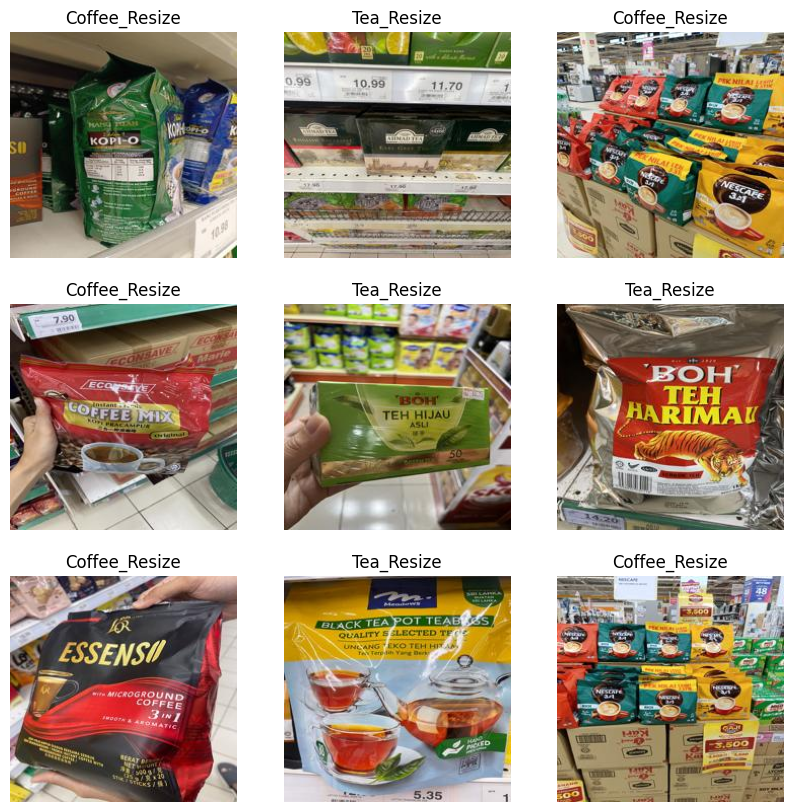

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

### 7. Create the base model from the pre-trained VGG16

(i) instantiate a VGG16 model pre-loaded with weights trained on ImageNet

In [ ]:
# Creating  base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

print("****VGG16 original network arhitecture****")
base_model.summary()

****VGG16 original network arhitecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxP

### ***2.2 RESULTS***

### **2.2.(a) No image augmentation, Only unfreeze the last layer**

1. Create new VGG16 model

In [ ]:
model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                           

2. Freeze and add the last layer with new dense layer

In [ ]:
# Freezing the existing weights
for layer in model.layers:
    layer.trainable = False
print(model.summary())

# Add the last layer with new dense layer with 2 outputs replacing the dense layer with 1000 outputs
model.add(tf.keras.layers.Dense(2))

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)      

3. Compile the model


In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

4. Train the model

In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
12/12 [==============================] - 381s 32s/step - loss: 0.7436 - accuracy: 0.6855 - val_loss: 0.5355 - val_accuracy: 0.7357
Epoch 2/3
12/12 [==============================] - 415s 35s/step - loss: 0.4216 - accuracy: 0.8233 - val_loss: 0.4802 - val_accuracy: 0.7429
Epoch 3/3
12/12 [==============================] - 418s 36s/step - loss: 0.2451 - accuracy: 0.8869 - val_loss: 0.4780 - val_accuracy: 0.7929


### 5. Plot the learning curves

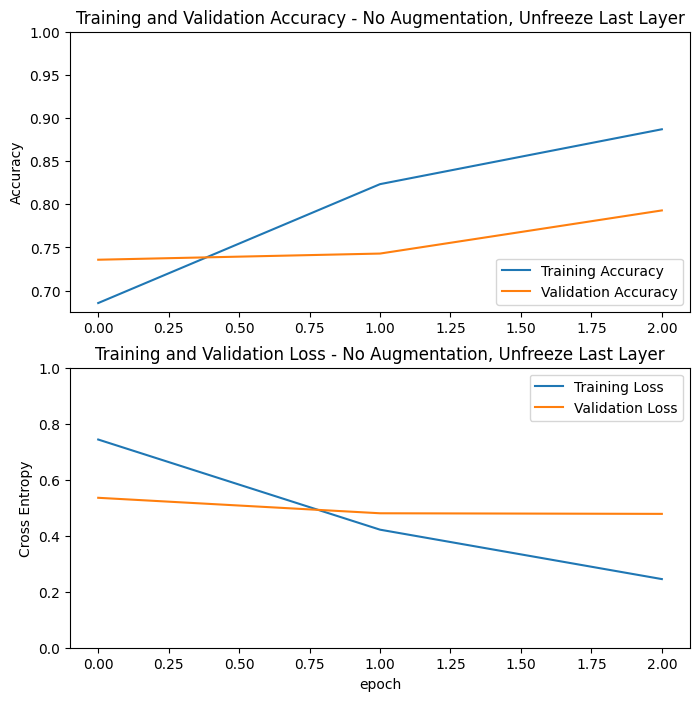

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy - No Augmentation, Unfreeze Last Layer')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss - No Augmentation, Unfreeze Last Layer')
plt.xlabel('epoch')
plt.show()

6. Test the model

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

7/7 [==============================] - 165s 23s/step - loss: 0.5422 - accuracy: 0.7591
Test accuracy: 0.7590758800506592


7. Visualize the image, the predicted label, actual label and the probability (in %)

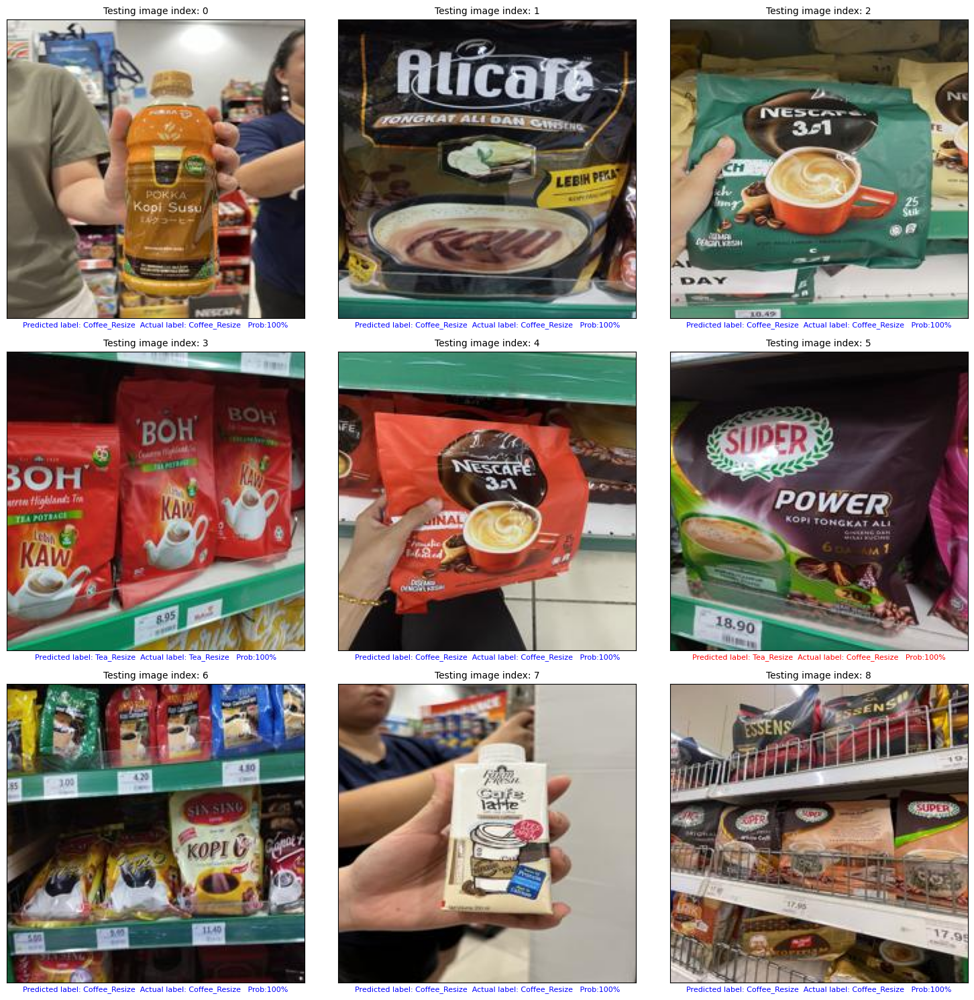

In [ ]:
def plot_image(i, predictions_array, true_label, img, fontsize=8):
    true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)
    predicted_label = np.argmax(predictions_array[i])

    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                                                              names[true_label],
                                                                              100*np.max(predictions_array)),
               color=color, fontsize=fontsize)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0])  # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)

plt.figure(figsize=(15, 15))
for index in range(9):
    ax = plt.subplot(3, 3, index + 1)
    plot_image(index, predicted_label_prob, single_test_image_batch[1], single_test_image_batch[0], fontsize=8)
    plt.title("Testing image index: {}".format(index), fontsize=10)  # Adjust the fontsize here

plt.tight_layout()  # Ensure the layout is tight
plt.show()


### **2.2.(b) With image augmentation, Only unfreeze the last layer**

1. Create augmentation with rotation, width shift and height shift

In [ ]:
# Create an instance of the ImageDataGenerator with desired augmentation options for training and validation
train_data_generator = ImageDataGenerator( validation_split=0.2,
                                          rotation_range = 20,
                                          width_shift_range=0.2,
                                          height_shift_range=0.2,
                                          )

2. Create train batch generator

In [ ]:
# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 566 images belonging to 2 classes.


3. Visualize augmentation images

(50, 224, 224, 3)
(50,)


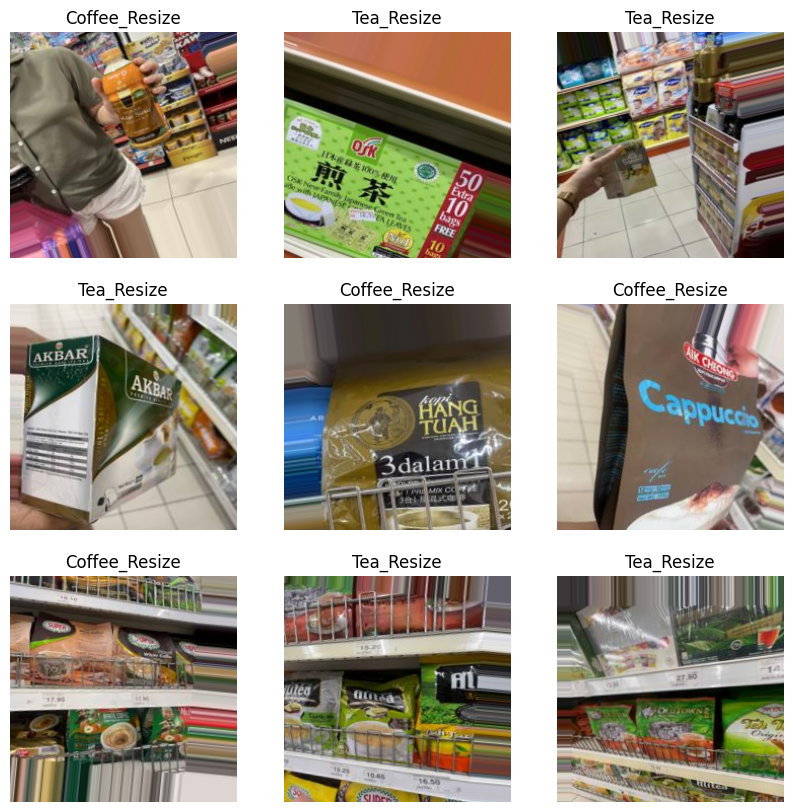

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

4. Create new VGG16 model

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

5. Freeze some layers and add last layer with dense layer

In [ ]:
#Freezing the existing weights
for layer in model.layers:
    layer.trainable = False

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

6. Compile the model

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

7. Train the model

In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
12/12 [==============================] - 385s 32s/step - loss: 0.2848 - accuracy: 0.8763 - val_loss: 0.5926 - val_accuracy: 0.7571
Epoch 2/3
12/12 [==============================] - 386s 33s/step - loss: 0.2576 - accuracy: 0.8993 - val_loss: 0.5687 - val_accuracy: 0.7500
Epoch 3/3
12/12 [==============================] - 385s 32s/step - loss: 0.2409 - accuracy: 0.9011 - val_loss: 0.6452 - val_accuracy: 0.8000


8. Plot the leaning curves

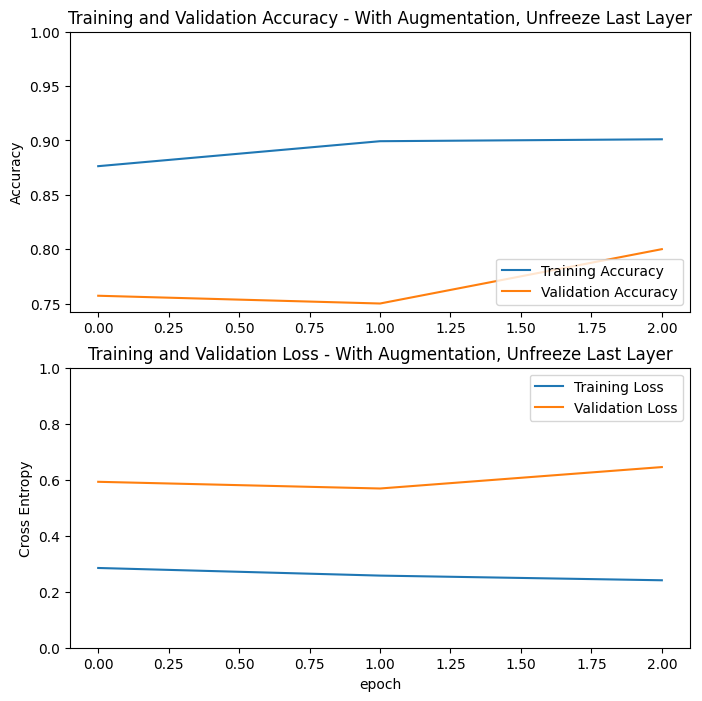

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy - With Augmentation, Unfreeze Last Layer')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss - With Augmentation, Unfreeze Last Layer')
plt.xlabel('epoch')
plt.show()

9. Test the model

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

7/7 [==============================] - 162s 22s/step - loss: 0.6003 - accuracy: 0.8053
Test accuracy: 0.8052805066108704


10. Visualize the image, the predicted label, actual label and the probability (in %)

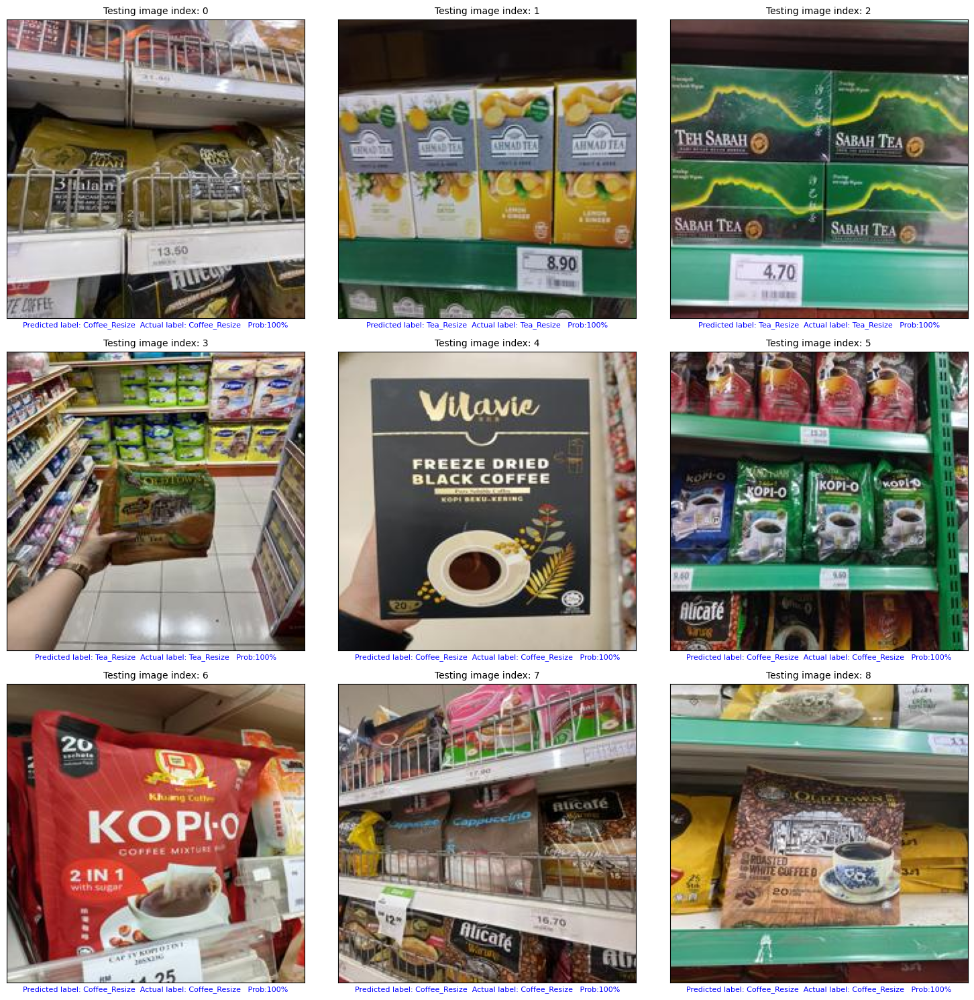

In [ ]:
def plot_image(i, predictions_array, true_label, img, fontsize=8):
    true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)
    predicted_label = np.argmax(predictions_array[i])

    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                                                              names[true_label],
                                                                              100*np.max(predictions_array)),
               color=color, fontsize=fontsize)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0])  # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)

plt.figure(figsize=(15, 15))
for index in range(9):
    ax = plt.subplot(3, 3, index + 1)
    plot_image(index, predicted_label_prob, single_test_image_batch[1], single_test_image_batch[0], fontsize=8)
    plt.title("Testing image index: {}".format(index), fontsize=10)  # Adjust the fontsize here

plt.tight_layout()  # Ensure the layout is tight
plt.show()

### **2.2.(c) No image augmentation, Only unfreeze the last and 2nd last layer**

1.Create the base model from the pre-trained VGG16

(i) instantiate a VGG16 model pre-loaded with weights trained on ImageNet

In [ ]:
import tensorflow as tf

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

print("****VGG16 original network architecture****")
base_model.summary()

****VGG16 original network architecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (Max

2. Create new VGG16 model

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                             

3. Freeze and add the last and 2nd last layer with new dense layers

In [ ]:
#Freezing the existing weights
for layer in model.layers[:-2]:
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

4. Compile the model

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

5. Train the model

In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
12/12 [==============================] - 391s 33s/step - loss: 0.8937 - accuracy: 0.5495 - val_loss: 0.8132 - val_accuracy: 0.6071
Epoch 2/3
12/12 [==============================] - 383s 32s/step - loss: 0.8761 - accuracy: 0.5495 - val_loss: 0.7964 - val_accuracy: 0.6071
Epoch 3/3
12/12 [==============================] - 396s 34s/step - loss: 0.8560 - accuracy: 0.5495 - val_loss: 0.7821 - val_accuracy: 0.6071


6. Plot the learning curves

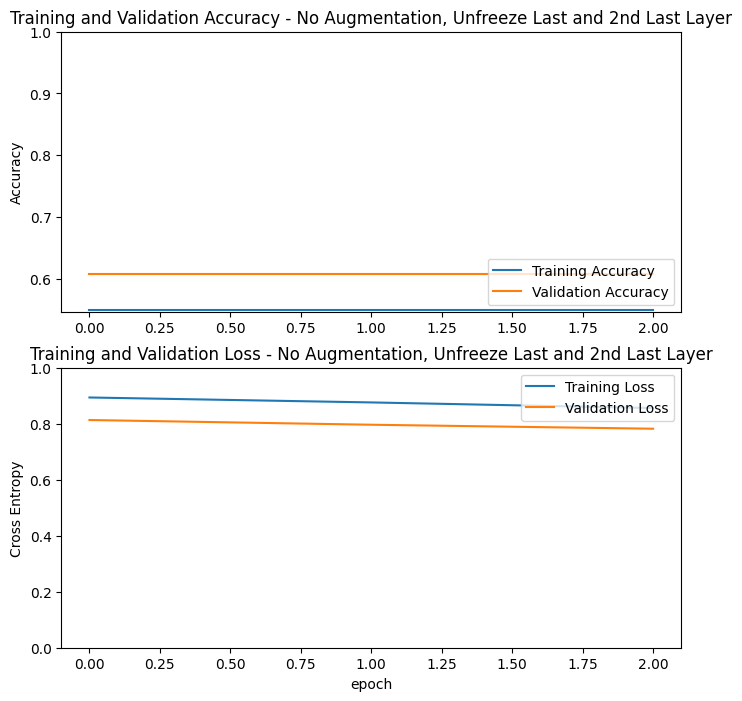

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy - No Augmentation, Unfreeze Last and 2nd Last Layer')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss - No Augmentation, Unfreeze Last and 2nd Last Layer')
plt.xlabel('epoch')
plt.show()

7. Test the model

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

7/7 [==============================] - 165s 23s/step - loss: 0.8210 - accuracy: 0.5974
Test accuracy: 0.5973597168922424


8. Visualize the image, the predicted label, actual label and the probability (in %)

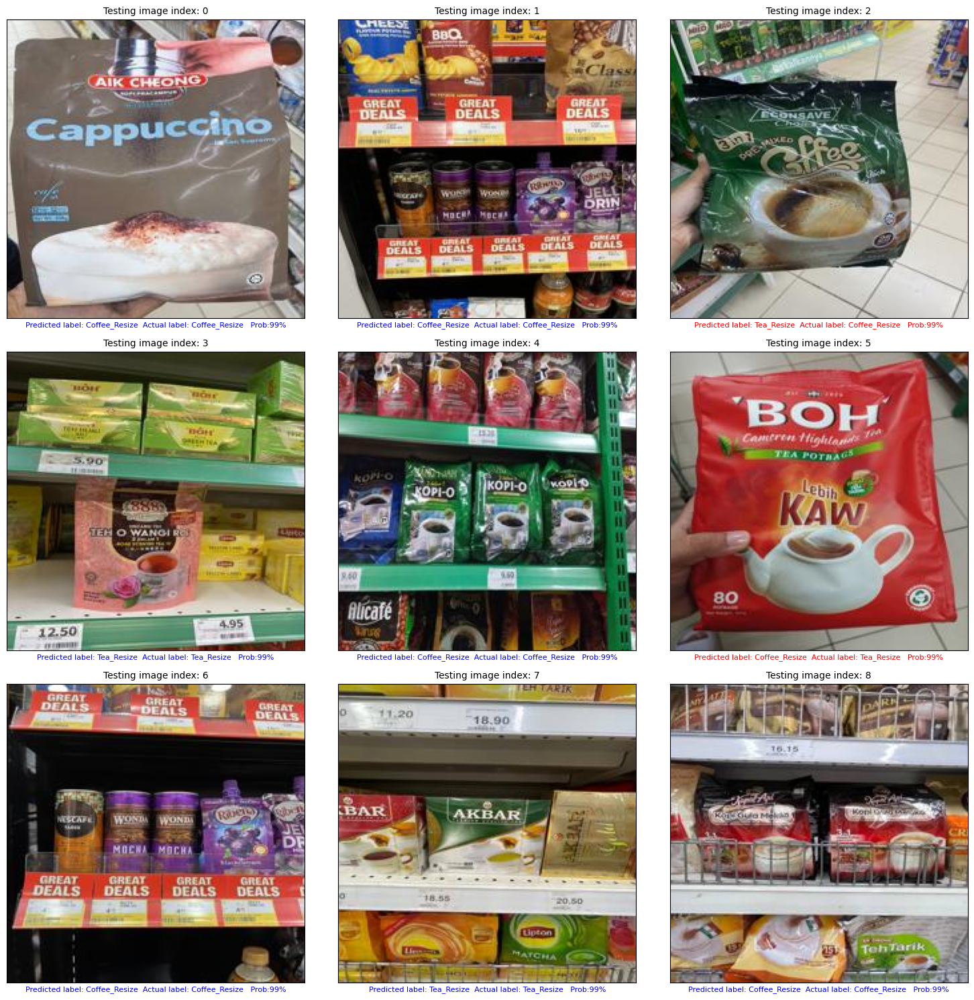

In [ ]:
def plot_image(i, predictions_array, true_label, img, fontsize=8):
    true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)
    predicted_label = np.argmax(predictions_array[i])

    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                                                              names[true_label],
                                                                              100*np.max(predictions_array)),
               color=color, fontsize=fontsize)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0])  # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)

plt.figure(figsize=(15, 15))
for index in range(9):
    ax = plt.subplot(3, 3, index + 1)
    plot_image(index, predicted_label_prob, single_test_image_batch[1], single_test_image_batch[0], fontsize=8)
    plt.title("Testing image index: {}".format(index), fontsize=10)  # Adjust the fontsize here

plt.tight_layout()  # Ensure the layout is tight
plt.show()

## Chapter 3: Discussion

The testing results show that the VGG16 model's performance varies significantly under different settings. Without data augmentation and with only the last layer unfrozen, the model wrongly predicted one label out of nine test samples with a 99% confidence level and testing accuracy of 0.7591. In contrast, when augmentation was used under identical conditions (just unfreezing the last layer), the model reached 100% accuracy, with all predictions being confident. The testing accuracy obtained is 0.8053 which is slightly higher compared to no image augmentation. It proves that image augmentation helps the model to generalize better and reduce overfitting. However, when the second and final layers were unfrozen without augmentation, the model made two inaccurate predictions, each with 99% confidence and a testing accuracy of 0.5974. The significant decrease in testing accuracy from 0.7591 to 0.5974 when unfreezing more layers indicates that an overfitting issue had occurred that led to the poor performance of the model.

Based on the previous study, data augmentation improved the performance of the fined-tuned VGG16 model with an unfrozen last layer (Poojary et al., 2021). The model achieved a test accuracy of 0.88 with data augmentation compared to 0.80 without it where both are slightly higher than the results of testing accuracy of this mini project. The difference between them may because the dataset used in the study is 700 images with 350 images of each class which is more larger and diverse dataset than this mini project's dataset. So, a more robust model with a larger dataset can obtain a higher testing accuracy.

These findings highlight the need for data augmentation in improving the model's ability to generalise while avoiding overfitting. When random transformations such as rotating, width shifting and height shifting are applied to the data, it creates more training examples. This will help the model to learn various features that represent real-world images. By doing this, the model can generalize the images instead of memorizing them, which reduce the risk of overfitting. Augmentation not only enhances robustness but also helps to maintain high accuracy by exposing the model to a variety of training data, reducing the risks associated with unfreezing new layers.

Increasing the size of a training dataset by data augmentation has gained popularity, especially in sectors where large datasets are normally unavailable. The goal of data augmentation is to produce more data, which is validated on an independent, unseen dataset and utilized to train the model. This technique has been found to increase performance (Chlap et al., 2021) . The result is successfully obtained even though the data set is not balanced, with the sample picture of tea receiving less 1 sample and the sample image of coffee receiving more 10 samples after resizing. In order to ensure that the model obtained a more representative and diverse set of training images, augmentation was used in this work to balance the dataset by producing extra examples for the minority class. This eventually enhanced the model's performance.

## Chapter 4: Conclusion

In conclusion, the project "Automated Groceries Detection for Visually Impaired Person" effectively addressed the need to enhance autonomy and accessibility in grocery shopping for visually impaired individuals. By leveraging Convolutional Neural Networks (CNNs) and transfer learning, specifically with the VGG16 architecture, the project aimed to classify grocery items such as coffee and tea from captured images.

The results demonstrated that data augmentation significantly improved the model's performance. Without data augmentation and with only the last layer unfrozen, the model achieved a testing accuracy of 0.7591 but made one incorrect prediction out of nine test samples. With data augmentation and the last layer unfrozen, the model achieved a higher testing accuracy of 0.8053 and correctly predicted all test samples. However, when both the second and final layers were unfrozen without data augmentation, the model's testing accuracy dropped to 0.5974, making two incorrect predictions out of nine test samples. This indicates that data augmentation is crucial for the model to generalize better and avoid overfitting.

These findings align with previous research, which showed that data augmentation improves the performance of fine-tuned VGG16 models, as seen in the study by Poojary et al. (2021), where the model achieved a test accuracy of 0.88 with data augmentation compared to 0.80 without it. The importance of increasing training dataset size through data augmentation is further supported by Chlap et al. (2021), who noted performance improvements even with imbalanced datasets. Additionally, research by Shorten and Khoshgoftaar (2019) highlights the benefits of data augmentation techniques in improving model generalization and reducing overfitting in various computer vision tasks.

While the project achieved promising results in identifying groceries under varied conditions, further research could focus on expanding the dataset size and diversity to enhance the model's performance further. By continuing to refine these methodologies, future iterations could contribute even more effectively to improving the shopping experience and autonomy of visually impaired individuals.

## References
1) Chlap, P., Min, H., Vandenberg, N., Dowling, J., Holloway, L., & Haworth, A. (2021). A review of medical image data augmentation techniques for deep learning applications. Journal of Medical Imaging and Radiation Oncology, 65(5), 545–563. https://doi.org/10.1111/1754-9485.13261

2) PhilJd. (2018). GitHub - PhilJd/freiburg_groceries_dataset: Freiburg Groceries Dataset. GitHub. https://github.com/PhilJd/freiburg_groceries_dataset

3) Poojary, R., Raina, R., & Kumar Mondal, A. (2021). Effect of data-augmentation on fine-tuned CNN model performance. IAES International Journal of Artificial Intelligence (IJ-AI), 10(1), 84. https://doi.org/10.11591/ijai.v10.i1.pp84-92

4) Salehi, A.W. et al. (29 March 2023) A Study of CNN and Transfer Learning in Medical Imaging: Advantages, Challenges, Future Scope. Sustainability 2023, 15, 5930. https://doi.org/10.3390/su15075930

5) Shorten, C., & Khoshgoftaar, T. M. (2019). A survey on image data augmentation for deep learning. Journal of Big Data, 6(1), 1-48. https://link.springer.com/article/10.1186/s40537-019-0197-0

6) Zhao, X. et al.(23 March 2024) A review of convolutional neural networks in computer vision. Artif Intell Rev 57, 99. https://doi.org/10.1007/s10462-024-10721-6